In [1]:
# import numpy for math calculations
import numpy as np

# import pandas for data (csv) manipulation
import pandas as pd

# import gc to collect garbage
import gc

# import matplotlib for plotting
import matplotlib.pyplot as plt
import matplotlib
matplotlib.style.use('fivethirtyeight') 
%matplotlib inline

# import seaborn for more plotting options(built on top of matplotlib)
import seaborn as sns

# import librosa for analysing audio signals : visualize audio, display the spectogram
import librosa
import soundfile as sf

# import librosa for analysing audio signals : visualize audio, display the spectogram
import librosa.display


# import wav for reading and writing wav files
import wave

# import IPython.dispaly for playing audio in Jupter notebook
import IPython.display as ipd

# import os for system operations
import os

# import random for get random values/choices
import random

# import sklearn for machine learning modelling and preprocessing
import sklearn

# import tensorflow for deep learning modelling
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPooling2D, BatchNormalization, Activation
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import load_model
from tensorflow.keras import backend as K

# importing from sklearn the evaluation metrics for classification
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import log_loss
from sklearn.metrics import confusion_matrix

# importing from sklearn model selection 
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, StratifiedKFold, learning_curve


# import tqdm to show a smart progress meter
from tqdm.notebook import trange,tqdm

# import warnings to hide the unnessairy warniings
import warnings
warnings.filterwarnings('ignore')

In [2]:
import random
SEED = 42
def seed_everything(seed=42): 
    random.seed(seed) 
    os.environ['PYTHONHASHSEED'] = str(seed) 
    np.random.seed(seed) 
seed_everything(SEED)

In [3]:
# To get a list of the pathes of all the audio files
data = "ESC-50-master/audio/"
dataset = pd.read_csv('ESC-50-master/meta/esc50.csv')
all_files = []
for path, subdirs, files in os.walk(data):
    for name in files:
        all_files.append(os.path.join(path, name))

global dataset
global data

        
# A dictionary to decode the categories into targets
decoder = {0: 'dog', 14: 'chirping_birds', 36: 'vacuum_cleaner', 19: 'thunderstorm', 30: 'door_wood_knock',34: 'can_opening', 9: 'crow', 22: 'clapping', 48: 'fireworks', 41: 'chainsaw', 47: 'airplane', 31: 'mouse_click', 17: 'pouring_water', 45: 'train', 8: 'sheep', 15: 'water_drops', 46: 'church_bells', 37: 'clock_alarm', 32: 'keyboard_typing', 16: 'wind', 25: 'footsteps', 4: 'frog', 3: 'cow', 27: 'brushing_teeth', 43: 'car_horn', 12: 'crackling_fire', 40: 'helicopter', 29: 'drinking_sipping', 10: 'rain', 7: 'insects', 26: 'laughing', 6: 'hen', 44: 'engine', 23: 'breathing', 20: 'crying_baby', 49: 'hand_saw', 24: 'coughing', 39: 'glass_breaking', 28: 'snoring', 18: 'toilet_flush', 2: 'pig', 35: 'washing_machine', 38: 'clock_tick', 21: 'sneezing', 1: 'rooster', 11: 'sea_waves', 42: 'siren', 5: 'cat', 33: 'door_wood_creaks', 13: 'crickets'}

# A dictionary to encode the categories into targets
encoder = {'dog': 0, 'chirping_birds': 14, 'vacuum_cleaner': 36, 'thunderstorm': 19, 'door_wood_knock': 30, 'can_opening': 34, 'crow': 9, 'clapping': 22, 'fireworks': 48, 'chainsaw': 41, 'airplane': 47, 'mouse_click': 31, 'pouring_water': 17, 'train': 45, 'sheep': 8, 'water_drops': 15, 'church_bells': 46, 'clock_alarm': 37, 'keyboard_typing': 32, 'wind': 16, 'footsteps': 25, 'frog': 4, 'cow': 3, 'brushing_teeth': 27, 'car_horn': 43, 'crackling_fire': 12, 'helicopter': 40, 'drinking_sipping': 29, 'rain': 10, 'insects': 7, 'laughing': 26, 'hen': 6, 'engine': 44, 'breathing': 23, 'crying_baby': 20, 'hand_saw': 49, 'coughing': 24, 'glass_breaking': 39, 'snoring': 28, 'toilet_flush': 18, 'pig': 2, 'washing_machine': 35, 'clock_tick': 38, 'sneezing': 21, 'rooster': 1, 'sea_waves': 11, 'siren': 42, 'cat': 5, 'door_wood_creaks': 33, 'crickets': 13}

print(dataset.shape)

(2000, 7)


In [4]:
plot_files = random.choices(all_files, k = 10)
plot_audios = [librosa.load(plot_files[i]) for i in range(10)]

# Exploring audio Data

In [5]:
# Importing 1 file
y, sr = librosa.load(data + "1-100032-A-0.wav")

print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (KHz):', sr, '\n')

# The duration is equal to the number of frames divided by the framerate
print('Duration of the audio file:', np.shape(y)[0]/sr, 'second')

y: [0. 0. 0. ... 0. 0. 0.] 

y shape: (110250,) 

Sample Rate (KHz): 22050 

Duration of the audio file: 5.0 second


In [6]:
ipd.Audio(data + "1-100032-A-0.wav")

# Distribution of categories

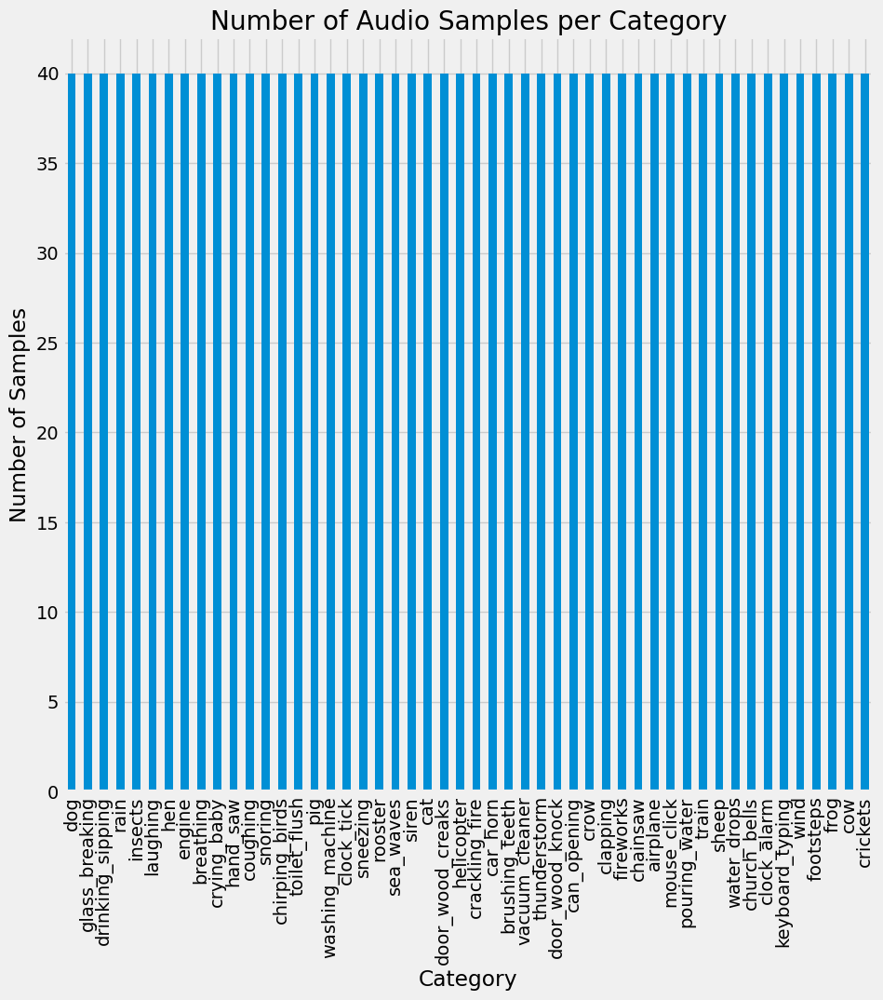

In [7]:
category_group = dataset['category'].value_counts()
plot = category_group.plot(kind='bar', title="Number of Audio Samples per Category", figsize=(10,10))
plot.set_xlabel("Category")
plot.set_ylabel("Number of Samples");

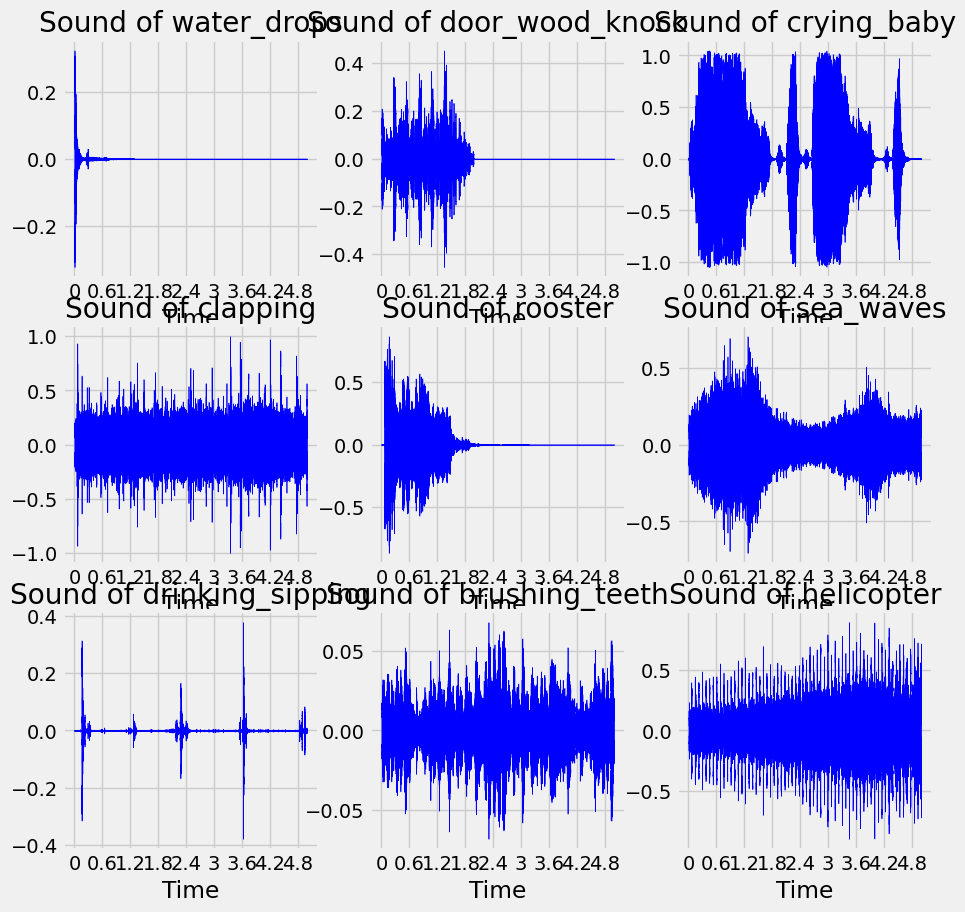

In [8]:
plt.figure(figsize=(10,10))  # i know this is giving an awful plot but i'm just trying to show the audio
for i in range(1, 10):
    plt.subplot(3, 3, i)
    librosa.display.waveshow(plot_audios[i][0], color='blue')  # You can choose any color you prefer
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])])
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])])


# Fourier transform

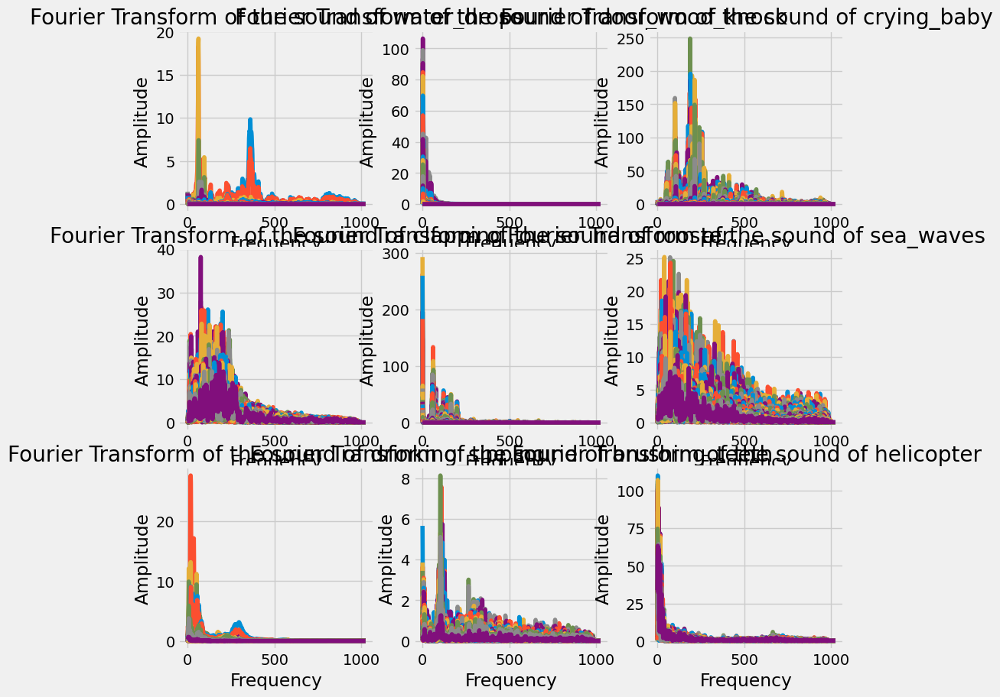

In [9]:
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns 

plt.figure(figsize=(10,10))
for i in range(1,10):
    plt.subplot(3,3,i)
    X = np.abs(librosa.stft(plot_audios[i][0], n_fft = n_fft, hop_length = hop_length))
    plt.plot(X)
    plt.xlabel("Frequency")
    plt.ylabel("Amplitude");
    try:
        plt.title("Fourier Transform of the sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Fourier Transform of the sound of " + decoder[int(plot_files[i][-5:-4])] )

# Spectrogram

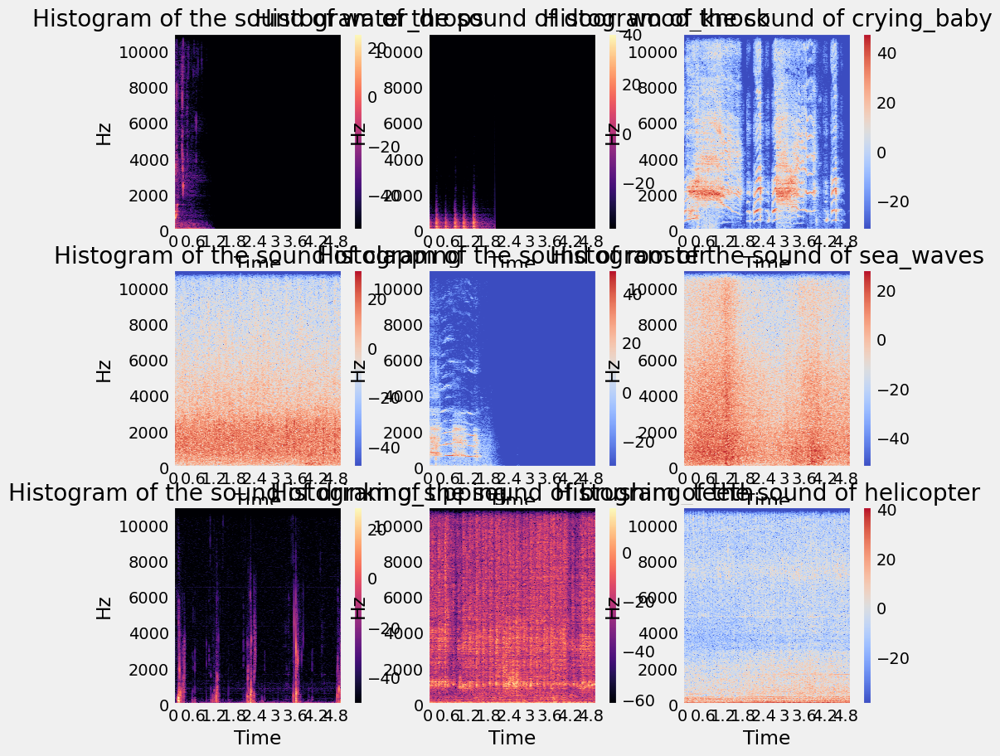

In [10]:
plt.figure(figsize=(10,10))
for i in range(1,10):
    plt.subplot(3,3,i)
    X = librosa.stft(plot_audios[i][0])
    Xdb = librosa.amplitude_to_db(abs(X))
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
    plt.colorbar()
    try:
        plt.title("Histogram of the sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Histogram of the sound of " + decoder[int(plot_files[i][-5:-4])] )

# Mel spectrogram

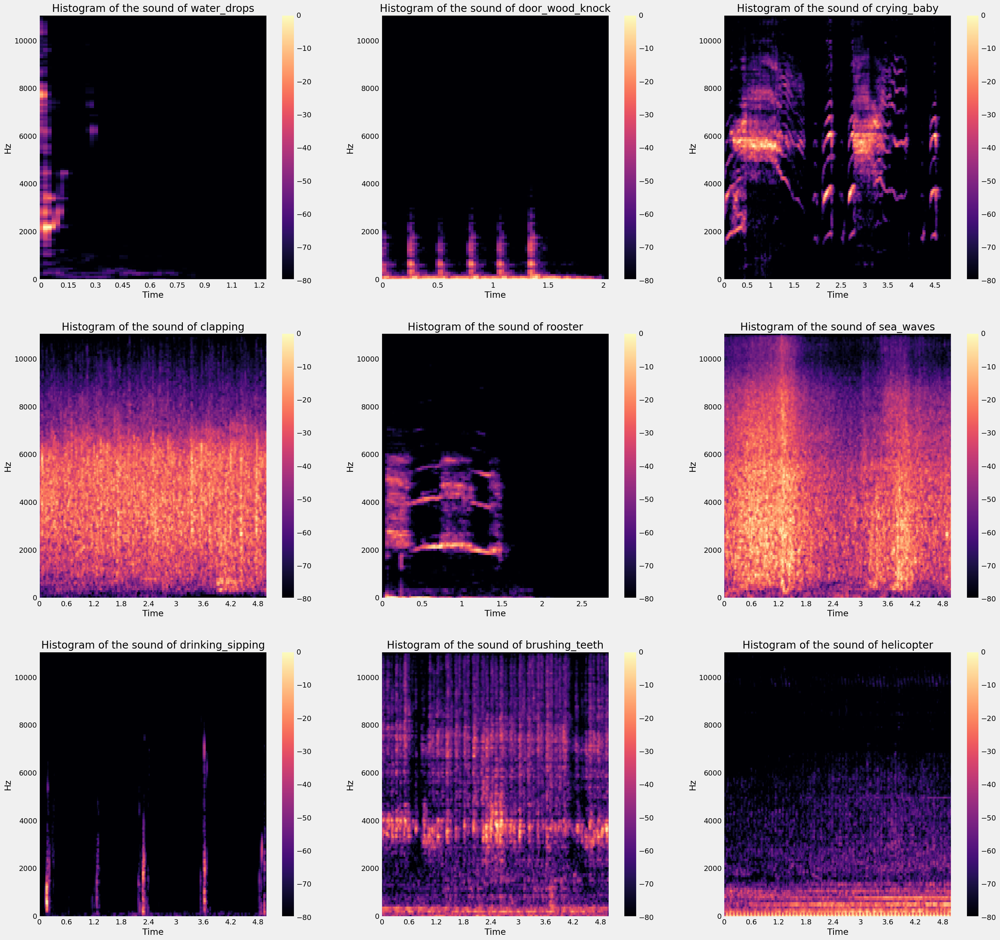

In [11]:
plt.figure(figsize=(30, 30))
for i in range(1, 10):
    plt.subplot(3, 3, i)
    X, _ = librosa.effects.trim(plot_audios[i][0])
    XS = librosa.feature.melspectrogram(y=X, sr=plot_audios[i][1])
    Xdb = librosa.amplitude_to_db(XS, ref=np.max)
    librosa.display.specshow(Xdb, sr=plot_audios[i][1], x_axis='time', y_axis='hz')
    plt.colorbar()
    try:
        plt.title("Histogram of the sound of " + decoder[int(plot_files[i][-6:-4])])
    except:
        plt.title("Histogram of the sound of " + decoder[int(plot_files[i][-5:-4])])


# Feature extraction

Zero-Crossing Rate: The zero-crossing rate (ZCR) is the rate at which a signal transitions from positive to zero to negative or negative to zero to positive. Its value has been extensively used in both speech recognition and music information retrieval for classifying percussive sounds.


The zero-crossing rate can be utilized as a basic pitch detection algorithm for monophonic tonal signals. Voice activity detection (VAD), which determines whether or not human speech is present in an audio segment, also makes use of zero-crossing rates.

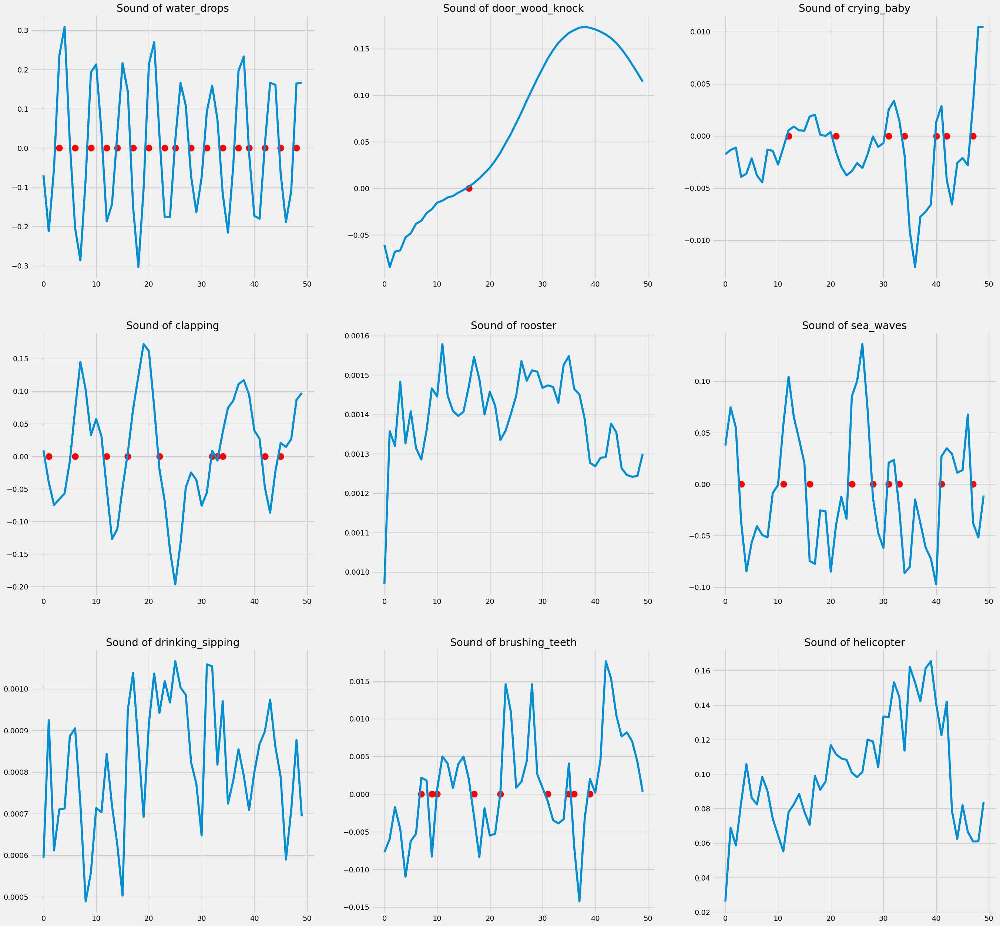

In [12]:
plt.figure(figsize=(30, 30))
for i in range(1, 10):
    plt.subplot(3, 3, i)
    zoom = 50
    y = plot_audios[i][0][0:zoom]
    
    # Plot the waveform using matplotlib.pyplot.plot
    plt.plot(y)
    
    # Overlay zero-crossings
    crossings = librosa.zero_crossings(y, pad=False)
    t = np.linspace(0, 0.0022, num=zoom)
    
    # Filter the zero-crossings and plot them
    plt.scatter(np.where(crossings)[0], y[crossings] * 0, color='r', linewidth=7.0)
    
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])])
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])])


## Harmonics and Perceptrual
Decompose an audio time series into harmonic and percussive components.

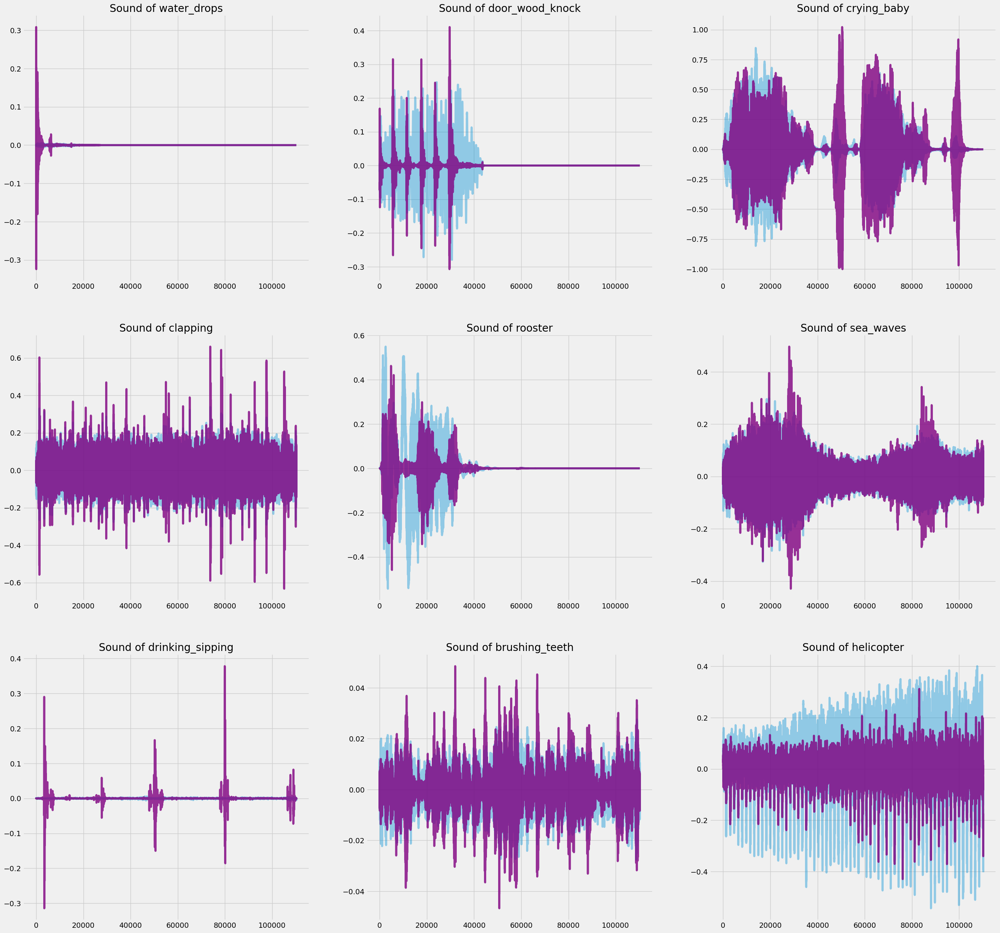

In [13]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    y_harm, y_perc = librosa.effects.hpss(plot_audios[i][0])
    plt.plot(y_harm, alpha=0.4);
    plt.plot(y_perc, color = 'purple', alpha=0.8);
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])] )

## Tempo BMP

In [14]:
for i in range(1, 10):
    tempo, _ = librosa.beat.beat_track(y=plot_audios[i][0], sr=plot_audios[i][1])
    try:
        print('File path:', plot_files[i][len(data):])
        print('Sound of ' + decoder[int(plot_files[i][-6:-4])])
        print('BPM:', tempo)
        print('--------------------------')
    except:
        print('File path:', plot_files[i][len(data):])
        print('Sound of ' + decoder[int(plot_files[i][-5:-4])])
        print('BPM:', tempo)
        print('--------------------------')


File path: 1-16746-A-15.wav
Sound of water_drops
BPM: 143.5546875
--------------------------
File path: 2-133889-A-30.wav
Sound of door_wood_knock
BPM: 92.28515625
--------------------------
File path: 2-107351-B-20.wav
Sound of crying_baby
BPM: 112.34714673913044
--------------------------
File path: 4-189832-A-22.wav
Sound of clapping
BPM: 117.45383522727273
--------------------------
File path: 4-170078-A-1.wav
File path: 4-170078-A-1.wav
Sound of rooster
BPM: 86.1328125
--------------------------
File path: 5-208810-B-11.wav
Sound of sea_waves
BPM: 129.19921875
--------------------------
File path: 1-32579-A-29.wav
Sound of drinking_sipping
BPM: 143.5546875
--------------------------
File path: 3-112522-A-27.wav
Sound of brushing_teeth
BPM: 151.99908088235293
--------------------------
File path: 1-172649-E-40.wav
Sound of helicopter
BPM: 129.19921875
--------------------------


## Spectral Centroid
The spectral centroid indicates at which frequency the energy of a spectrum is centered upon or in other words It indicates where the ” center of mass” for a sound is located. 

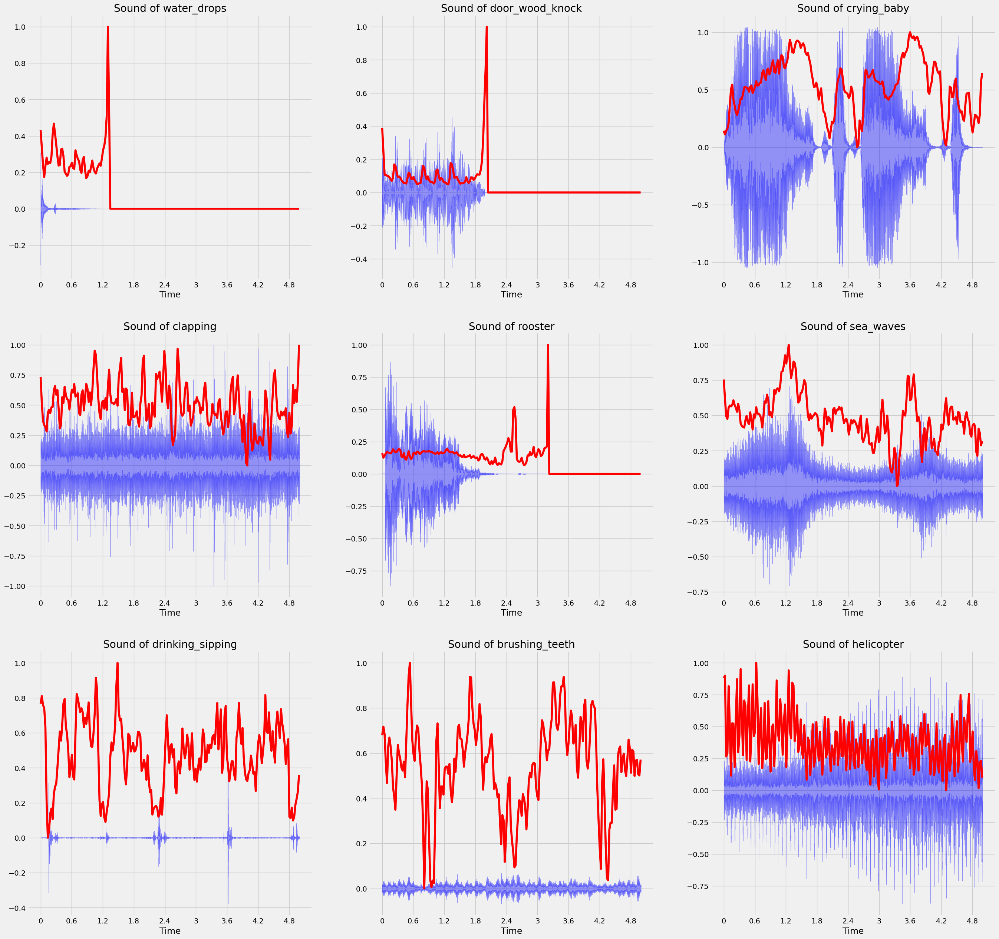

In [15]:
plt.figure(figsize=(30,30))
# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

for i in range(1,10):
    plt.subplot(3,3,i)
    librosa.display.waveshow(plot_audios[i][0], alpha=0.4, color='b')
    spectral_centroids = librosa.feature.spectral_centroid(y=plot_audios[i][0], sr=plot_audios[i][1])[0]
    frames = range(len(spectral_centroids))
    t = librosa.frames_to_time(frames)
    t = librosa.frames_to_time(frames)
    plt.plot(t, normalize(spectral_centroids), color='r')
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])] )

## Spectral Rolloff
The spectral rolloff is a measure of the shape of the spectrum of an audio signal. It is defined as the frequency below which a certain percentage of the total energy of the signal lies. The roll-off point is often expressed as a percentage of the total energy, such as 85% or 95%.

The spectral rolloff can provide information about the tonality of a sound, as sounds that are more tonal will have a lower rolloff point than sounds that are more noise-like. For example, a piano playing a sustained note will have a lower rolloff point than a snare drum hit.

The spectral rolloff can be calculated by first computing the power spectrum of the audio signal, and then finding the frequency below which a certain percentage of the total energy of the signal lies. The spectral rolloff can be computed for different percentage values, and the result can be a single value, or a set of values for different percentages.

The spectral rolloff can be used in various audio-related tasks, such as music genre classification, sound event detection, and speech analysis, as it can be a useful feature to distinguish different audio classes. It can also be used in combination with other features, such as Mel-Frequency Cepstral Coefficients (MFCCs) or Chroma feature, to improve the performance of audio classification tasks.

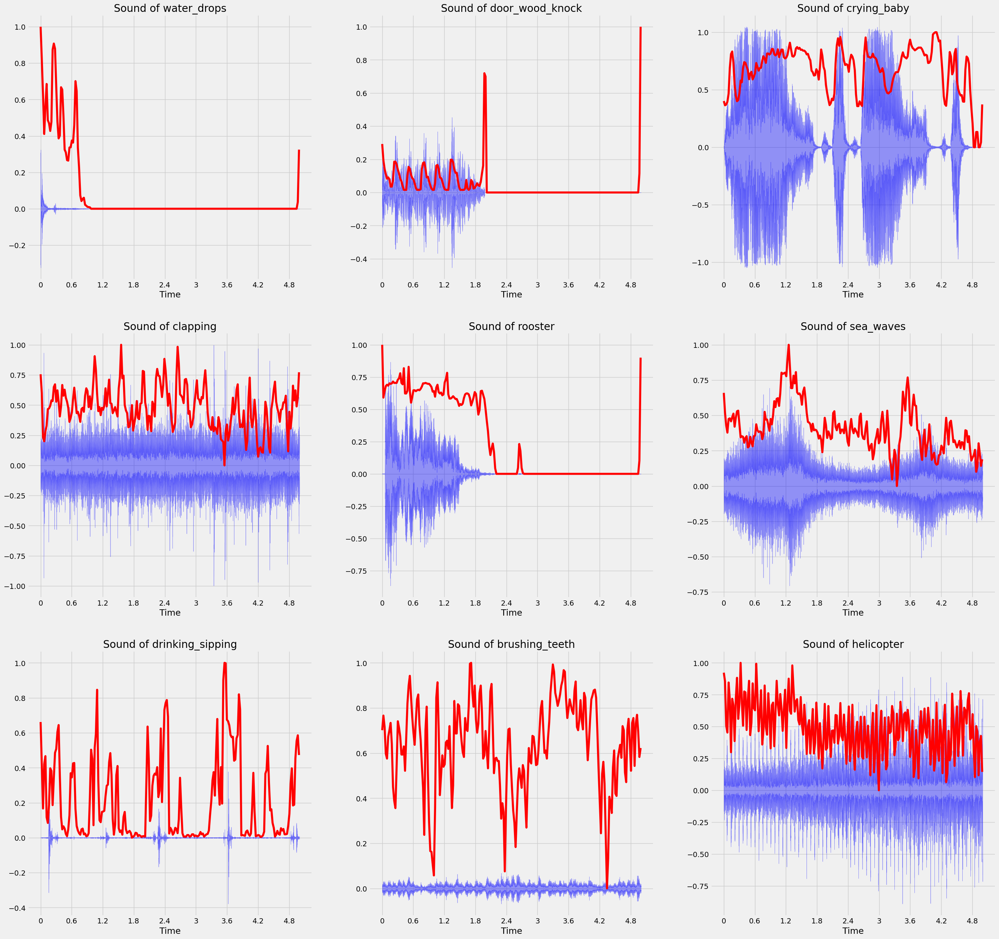

In [16]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    librosa.display.waveshow(plot_audios[i][0],alpha=0.4, color='b')
    spectral_rolloff = librosa.feature.spectral_rolloff(y=plot_audios[i][0]+0.01, sr=plot_audios[i][1])[0]
    frames = range(len(spectral_rolloff))
    t = librosa.frames_to_time(frames)
    plt.plot(t, normalize(spectral_rolloff), color='r')
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])] )

## Spectral Bandwidth
The spectral bandwidth is defined as the width of the band of light at one-half the peak maximum (or full width at half maximum [FWHM]) and is represented by the two vertical red lines and λSB on the wavelength axis.

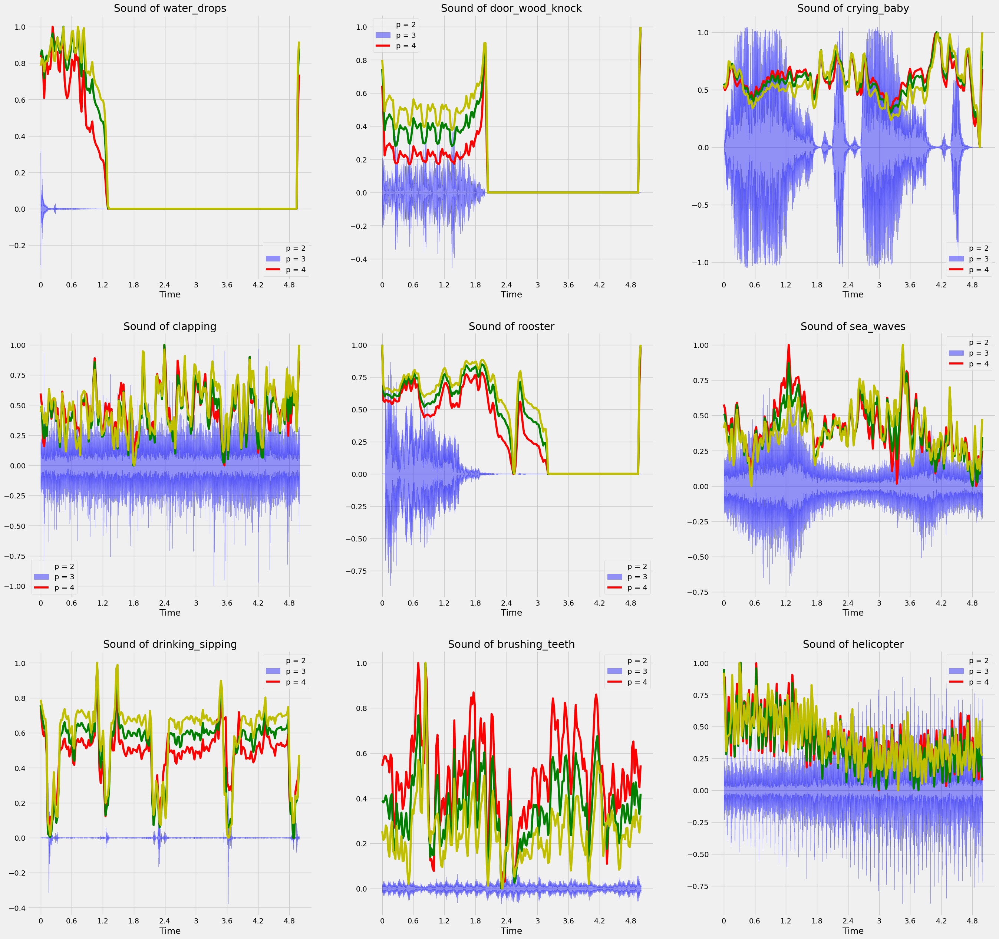

In [17]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    librosa.display.waveshow(plot_audios[i][0], alpha=0.4, color = 'b')
    spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(y = plot_audios[i][0]+0.01, sr=plot_audios[i][1])[0]
    spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(y = plot_audios[i][0]+0.01, sr=plot_audios[i][1], p=3)[0]
    spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(y = plot_audios[i][0]+0.01, sr=plot_audios[i][1], p=4)[0]
    plt.plot(t, normalize(spectral_bandwidth_2), color='r')
    plt.plot(t, normalize(spectral_bandwidth_3), color='g')
    plt.plot(t, normalize(spectral_bandwidth_4), color='y')
    plt.legend(('p = 2', 'p = 3', 'p = 4'))
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])] )

## Chroma feature
Chroma feature is a representation of the harmonic structure of an audio signal. It is a powerful feature for music analysis and can be used for tasks such as music genre classification, chord recognition, and tonality analysis.

A Chroma feature is calculated by first transforming the audio signal into the frequency domain using a Fourier transform. The signal is then mapped into a new feature space called the Chroma space, which consists of 12 bins corresponding to the 12 distinct semitones of Western music.

Each bin represents the energy of the audio signal at a specific pitch class (C, C#, D, D#, etc.) and is calculated by summing the energy of all the notes in the signal that belong to that pitch class. The resulting Chroma feature is a 12-dimensional vector, where each dimension represents the energy of the audio signal at a specific pitch class.

The Chroma feature is robust to changes in tempo and instrumentation, which makes it a useful feature for tasks such as music genre classification and chord recognition. It can also be used in conjunction with other features, such as Mel-Frequency Cepstral Coefficients (MFCCs) or spectral rolloff, to improve the performance of audio classification tasks.

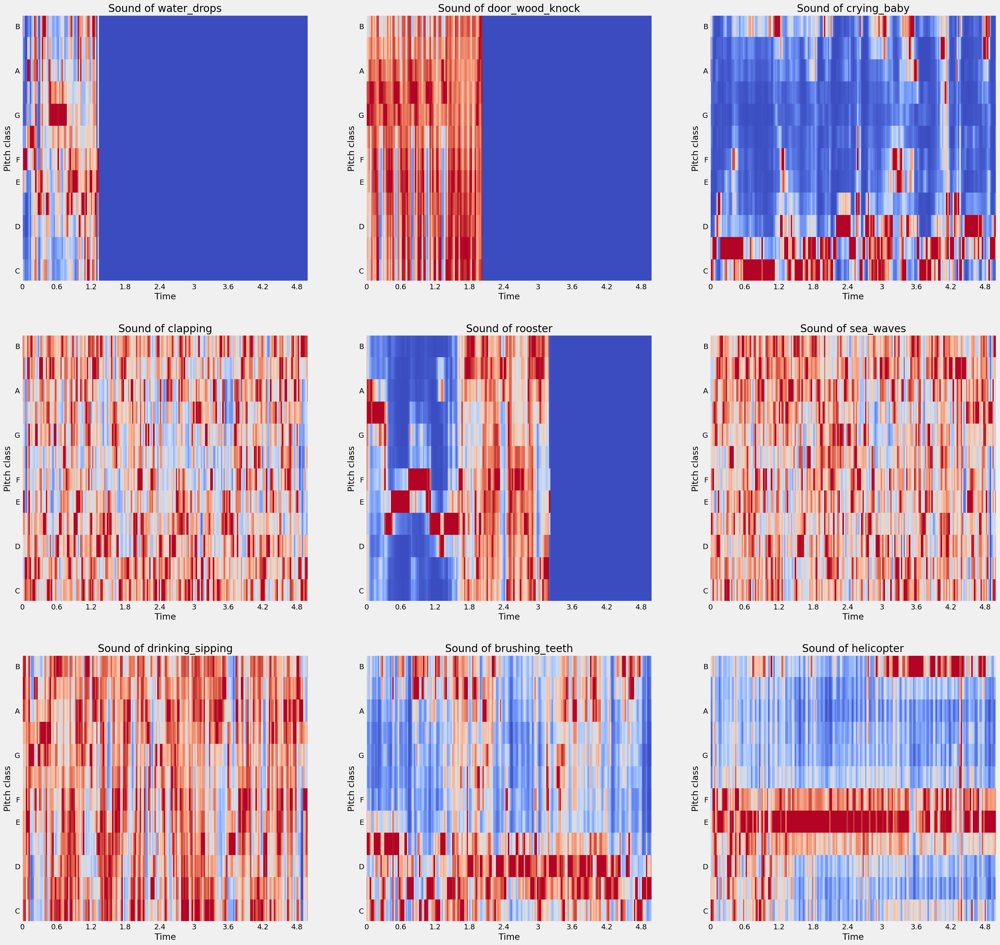

In [18]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    chromagram = librosa.feature.chroma_stft(y = plot_audios[i][0], sr=plot_audios[i][1], hop_length=hop_length)
    librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='coolwarm')
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])] )

## Mel-Frequency Cepstral Coefficients (MFCCs)
Mel-Frequency Cepstral Coefficients (MFCCs) are a set of features commonly used in speech and music processing applications to represent the spectral characteristics of an audio signal. They are based on the human perception of sound and are designed to capture the spectral envelope of the audio signal, which is the shape of the signal's power spectrum over time.

The MFCCs are calculated in several steps:

The audio signal is transformed into the frequency domain using a Fourier transform.
The Mel scale is applied to the frequency axis of the signal, which approximates the non-linear frequency response of the human ear.
The logarithm of the energy in each Mel-frequency bin is taken to obtain the Mel-frequency spectrogram.
A Discrete Cosine Transform (DCT) is applied to the Mel-frequency spectrogram to obtain the MFCCs.
The result of these steps is a set of coefficients that represent the spectral envelope of the audio signal. The number of MFCCs used in a given application can vary, but typically, between 12 and 40 coefficients are used.

MFCCs are robust to variations in the audio signal, such as changes in pitch, speed, and noise. They are widely used in speech and music processing tasks such as speech recognition, music genre classification, and speaker identification. They can also be used in conjunction with other features, such as Chroma feature or Spectral rolloff, to improve the performance of audio classification tasks.

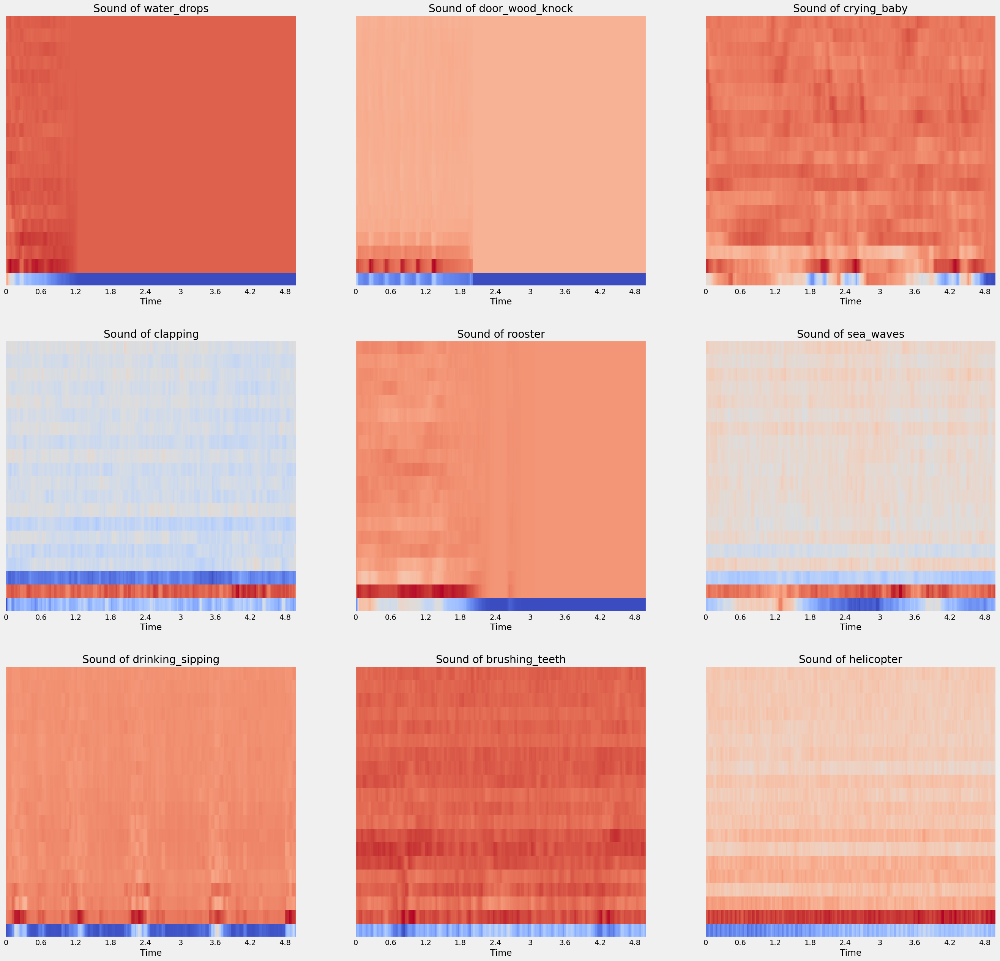

In [19]:
plt.figure(figsize=(30,30))
for i in range(1,10):
    plt.subplot(3,3,i)
    mfccs = librosa.feature.mfcc(y = plot_audios[i][0], sr=plot_audios[i][1])
    librosa.display.specshow(mfccs, sr=plot_audios[i][1], x_axis='time')
    try:
        plt.title("Sound of " + decoder[int(plot_files[i][-6:-4])] )
    except:
        plt.title("Sound of " + decoder[int(plot_files[i][-5:-4])] )

# Feature Engineering
There are several features that can be extracted from the audio files in the ESC-50 dataset, including:

Mel-Frequency Cepstral Coefficients (MFCCs): These are a set of features that represent the spectral characteristics of an audio signal and are based on the human perception of sound.

Spectral Rolloff: It is a measure of the shape of the spectrum of an audio signal that can provide information about the tonality of a sound.

Chroma Feature: It is a representation of the harmonic structure of an audio signal and can be used for tasks such as music genre classification, chord recognition, and tonality analysis.

Spectral Centroid: It is a measure of the center of gravity of the audio spectrum and can be used to estimate the brightness of a sound.

Spectral Bandwidth: It is a measure of the width of the audio spectrum and can be used to estimate the sharpness of a sound.

Zero Crossing Rate: It is a measure of the number of times the audio signal crosses the zero-level amplitude, and it can be used to estimate the presence of noise or harmonic content.

### AUGMENTED functions

Data augmentation can be used to improve the robustness and generalization of machine learning models by introducing variation into the training data. This can help the model to learn more robust features that are less dependent on specific variations in the data.

There are several types of data augmentation that can be applied to the ESC-50 dataset:

Time stretching : This technique changes the duration of the audio signal by speeding it up or slowing it down. This can be useful for simulating variations in the tempo of the audio.

Pitch shifting: This technique changes the pitch of the audio signal by shifting it up or down. This can be useful for simulating variations in the pitch of the audio.

Volume scaling: This technique changes the volume of the audio signal by scaling it up or down. This can be useful for simulating variations in the loudness of the audio.

Add noise : This technique adds noise to the audio signal to simulate different noise conditions.

Time shifting: This technique changes the position of the audio signal in time by shifting it forwards or backwards. This can be useful for simulating variations in the timing of the audio.

Echo: This technique adds a delayed copy of the audio signal to simulate an echo effect



In [5]:
def add_noise(data):
    noise = np.random.normal(0, 0.1, len(data))
    audio_noisy = data + noise
    return audio_noisy
    
def pitch_shifting(data):
    sr  = 16000
    bins_per_octave = 12
    pitch_pm = 2
    pitch_change =  pitch_pm * 2*(np.random.uniform())   
    data = librosa.effects.pitch_shift(data.astype('float64'),  sr, n_steps=pitch_change, 
                                          bins_per_octave=bins_per_octave)
    return pitch_shifting

def random_shift(data):
    timeshift_fac = 0.2 *2*(np.random.uniform()-0.5)  # up to 20% of length
    start = int(data.shape[0] * timeshift_fac)
    if (start > 0):
        data = np.pad(data,(start,0),mode='constant')[0:data.shape[0]]
    else:
        data = np.pad(data,(0,-start),mode='constant')[0:data.shape[0]]
    return data

def volume_scaling(data):
    sr  = 16000
    dyn_change = np.random.uniform(low=1.5,high=2.5)
    data = data * dyn_change
    return data

def time_stretching(data, rate=1.5):
    input_length = len(data)
    streching = data.copy()
    streching = librosa.effects.time_stretch(y = streching, rate=rate)
    
    if len(streching) > input_length:
        streching = streching[:input_length]
    else:
        streching = np.pad(data, (0, max(0, input_length - len(streching))), "constant")
    return streching
def audio_augmentation(file, aug):
    directory = 'ESC-50-master/ESC-50-augmented-data/'
    if not os.path.exists(directory):
        os.makedirs(directory)
    aug = np.array(aug,dtype='float32').reshape(-1,1)
    sf.write(directory+'/'+ file, aug, 16000, 'PCM_24')

def data_aug(path_audio):
    path_ = np.random.choice(os.listdir(path_audio), size = (2000,), replace= False)
    for k,files in zip(range(len(path_)), path_):
        if files[0] != "5":
            data_, fs = librosa.load(os.path.join(path_audio, files), sr = 44000)
            noise_data = add_noise(data_)
            random_shift_data = random_shift(data_)
            volume_scale_data = volume_scaling(data_)
            time_stretching_data =  time_stretching(data_, rate=1.5)
            aug = [noise_data,time_stretching_data, random_shift_data,volume_scale_data ]
            for j in range(len(aug)):
                filename = (files[0:2]+'generated'+'-'+str(j)+'-'+str(k)+'-'+files[2:])
                audio_augmentation(filename, aug[j])


In [35]:
def create_esc_dataset(dataset):
    n_samples = dataset['filename'].shape[0]
    dataset['zero_crossing_rate'] = np.zeros(n_samples)
    dataset['chroma_stft'] = np.zeros(n_samples)
    dataset['rmse'] = np.zeros(n_samples)
    dataset['spectral_centroid'] = np.zeros(n_samples)
    dataset['spectral_bandwidth'] = np.zeros(n_samples)
    dataset['beat_per_minute'] = np.zeros(n_samples)
    dataset['rolloff'] = np.zeros(n_samples)
    for i in range(0, 20):
        dataset[f'mfcc_{i}'] = np.zeros((n_samples,))

    for i in tqdm(range(n_samples)):
        y , sr = librosa.load(dataset['files_path'][i], mono=True)
        dataset['rmse'][i] = np.mean(librosa.feature.rms(y=y))
        dataset['chroma_stft'][i] = np.mean(librosa.feature.chroma_stft(y=y, sr=sr))
        dataset['spectral_centroid'][i] = np.mean(librosa.feature.spectral_centroid(y=y, sr=sr))
        dataset['spectral_bandwidth'][i] = np.mean(librosa.feature.spectral_bandwidth(y=y, sr=sr))
        dataset['rolloff'][i] = np.mean(librosa.feature.spectral_rolloff(y=y, sr=sr))
        dataset['zero_crossing_rate'][i] = np.mean(librosa.feature.zero_crossing_rate(y))
        tempo, _ = librosa.beat.beat_track(y=y, sr=sr)
        dataset['beat_per_minute'] = tempo
        mfcc = librosa.feature.mfcc(y=y, sr=sr)
        for e in range(0, 20):
            dataset[f'mfcc_{e}'][i] = np.mean(mfcc[e])
    return dataset


path_audio = 'ESC-50-master/audio/'

# if doesnt exists files in esc-50-augmented-data: data_aug(path_audio)
if not os.path.exists('ESC-50-master/ESC-50-augmented-data/'):
    data_aug(path_audio)
if not os.path.exists('esc50_features_normal.csv'):
    dataset_features = create_esc_dataset(dataset)
    dataset_features.to_csv('esc50_features.csv', index=False) 

  0%|          | 0/4000 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [5]:
# this is for the augmented data
augment = False

if augment is True:
    all_files = []
    dataset['files_path'] = data+dataset['filename']
    dataset  = dataset.drop(columns=['esc10','take','src_file','category'])
    data_aug = 'ESC-50-master/ESC-50-augmented-data/'
    for path, subdirs, files in os.walk(data_aug):
        for name in files:
            fold = int(name[0])
            target = int(name.split('-')[-1].replace('.wav', ''))
            file_path = data_aug + name
            dataset.loc[-1] = [name, fold, target, file_path]
            dataset.index = dataset.index + 1  # shifting index
            dataset = dataset.sort_index()
            all_files.append(os.path.join(path, name))
else:
    dataset  = dataset.drop(columns=['esc10','take','src_file','category'])
print(dataset.shape, dataset.columns)
print(dataset.head())


(2000, 3) Index(['filename', 'fold', 'target'], dtype='object')
            filename  fold  target
0   1-100032-A-0.wav     1       0
1  1-100038-A-14.wav     1      14
2  1-100210-A-36.wav     1      36
3  1-100210-B-36.wav     1      36
4  1-101296-A-19.wav     1      19


In [26]:
dataset.head()

,filename,fold,target
0,1-100032-A-0.wav,1,0
1,1-100038-A-14.wav,1,14
2,1-100210-A-36.wav,1,36
3,1-100210-B-36.wav,1,36
4,1-101296-A-19.wav,1,19


# Preprocessing
Train Test Split : To have unknown datapoints to test the data rather than testing with the same points with which the model was trained. This helps capture the model performance much better.

About Stratify : Stratify parameter makes a split so that the proportion of values in the sample produced will be the same as the proportion of values provided to parameter stratify.

For example, if variable y is a binary categorical variable with values 0 and 1 and there are 25% of zeros and 75% of ones, stratify=y will make sure that your random split has 25% of 0's and 75% of 1's.

In [6]:
def compute_log_mel_spect(audio,sample_rate):  # Size of the Fast Fourier Transform (FFT), which will also be used as the window length
    n_fft=1024
    hop_length=512
    window_type ='hann'
    mel_bins = 60 # Number of mel bands
    normalized_y = librosa.util.normalize(audio)
    Mel_spectrogram = librosa.feature.melspectrogram(y=normalized_y, sr=22050,hop_length=hop_length, win_length=n_fft, n_mels = mel_bins)
    mel_spectrogram_db = librosa.power_to_db(Mel_spectrogram)
    return  mel_spectrogram_db

In [28]:
dataset['filename']

0        1-100032-A-0.wav
1       1-100038-A-14.wav
2       1-100210-A-36.wav
3       1-100210-B-36.wav
4       1-101296-A-19.wav
              ...        
1995     5-263831-B-6.wav
1996    5-263902-A-36.wav
1997     5-51149-A-25.wav
1998      5-61635-A-8.wav
1999       5-9032-A-0.wav
Name: filename, Length: 2000, dtype: object

In [47]:
dataset.columns

Index(['filename', 'fold', 'target', 'data'], dtype='object')

In [104]:
# import stratified shuffle split
from sklearn.model_selection import StratifiedShuffleSplit

# Preparing training data, for CNN we're gonna use the MFCC features
data=[]
path = 'ESC-50-master/audio/'
X_cnn = []
y_cnn = []

for data in tqdm(dataset.iterrows(),  desc='Progress'):
    sig , sr = librosa.load(path+data[1][0])
    mfcc_ = librosa.feature.mfcc(y = sig , sr=sr, n_mfcc=40)

    X_cnn.append(mfcc_)
    y_cnn.append(data[1][1])


X_cnn = np.array(X)
X_cnn = (X - X.min())/(X.max() - X.min()) # normalizing the data between 0 and 1
y_cnn = np.array(y)

print(X_cnn.shape, y_cnn.shape)


Progress: 0it [00:00, ?it/s]

(2000, 40, 216) (2000,)


In [105]:
X_cnn = X_cnn.reshape(X_cnn.shape[0], X_cnn.shape[1], X_cnn.shape[2], 1)
y_cnn = tf.keras.utils.to_categorical(y_cnn, num_classes = 50)

In [111]:
train_df

,filename,fold,target,data
658,2-54086-A-43.wav,2,43,"[[0.6272049, 0.60056525, 0.4885339, 0.4904347,..."
815,3-103401-C-33.wav,3,33,"[[0.060540717, 0.09168357, 0.047163595, 0.0234..."
279,1-56269-A-18.wav,1,18,"[[0.0, 0.1648865, 0.1899633, 0.20514347, 0.186..."
230,1-47819-B-5.wav,1,5,"[[0.0, 0.04557253, 0.04597716, 0.04907997, 0.0..."
1553,4-212728-A-34.wav,4,34,"[[0.16965435, 0.18383309, 0.59474266, 0.772161..."
...,...,...,...,...
1442,4-186518-A-30.wav,4,30,"[[0.0, 0.010027823, 0.018140493, 0.017457495, ..."
63,1-17565-A-12.wav,1,12,"[[0.0, 0.31130382, 0.47217706, 0.45655033, 0.3..."
1982,5-260875-A-35.wav,5,35,"[[0.042700242, 0.07051799, 0.018837256, 0.0257..."
535,2-125966-A-11.wav,2,11,"[[0.39392343, 0.4947471, 0.46854424, 0.4020441..."


In [114]:
# Splitting the data into training and testing sets
X_train_cnn, X_test_cnn, y_train_cnn, y_test_cnn = train_test_split(X_cnn, y_cnn, test_size=0.2, random_state=42)


print("Size of the training set : ", X_train.shape )
print("Size of the testing set : ", X_test.shape )

Size of the training set :  (1600, 40, 216, 1)
Size of the testing set :  (400, 40, 216, 1)


# Modeling

### Useful Functions

In [61]:
def plot_confusion_matrix(cm, title='Confusion matrix', cmap=plt.cm.Blues):
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

def plot_learning_curve(estimator, title, X, y, ylim=None, cv=None,
                        n_jobs=-1, train_sizes=np.linspace(.1, 1.0, 5)):
    """Generate a simple plot of the test and training learning curve"""
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    plt.grid()
    train_sizes, train_scores, test_scores = learning_curve(
        estimator, X, y, cv=cv, n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

def plot_importance(df):
    """
    Builds the dataset to plot the feature importance.
    
    """
    # Sort features according to importance
    df = df.sort_values(['Importance'],ascending=False).reset_index()
    
    # drop the old index to avoid confusion
    df = df.drop(['index'],axis=1)
    
    # Make a horizontal bar chart of feature importances
    plt.figure(figsize = (10, 9))
    ax = plt.subplot()
    
    # Need to reverse the index to plot most important on top
    ax.barh(list(reversed(list(df.index[:30]))), 
            df['Importance'].head(30), 
            align = 'center', edgecolor = 'k')
    
    # Set the yticks and labels
    ax.set_yticks(list(reversed(list(df.index[:30]))))
    ax.set_yticklabels(df['Feature'].head(30))
    
    plt.xlabel("Normalized feature importance")
    plt.ylabel("Features")
    
    plt.show()
    return df


## CNN

### Data preparation

In [115]:
# let's build a CNN model in tensorflow
input_shape = (X_train.shape[1], X_train.shape[2], 1)

# reset the memory of tensorflow
tf.keras.backend.clear_session()
CNN_model = Sequential([
    tf.keras.layers.Conv2D(64, (3, 3), padding='valid', input_shape=input_shape),
    tf.keras.layers.MaxPooling2D(2, padding='same'),
    tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='valid'),
    tf.keras.layers.MaxPooling2D(2, padding='same'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Conv2D(128, (2, 2), activation='relu', padding='valid'),
    tf.keras.layers.MaxPooling2D(2, padding='same'),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Conv2D(128, (2, 2), activation='relu', padding='valid'),
    tf.keras.layers.MaxPooling2D(2, padding='same'),
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dense(50, activation='softmax')
])

CNN_model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
CNN_model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 38, 214, 64)       640       
                                                                 
 max_pooling2d (MaxPooling2  (None, 19, 107, 64)       0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 17, 105, 128)      73856     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 9, 53, 128)        0         
 g2D)                                                            
                                                                 
 dropout (Dropout)           (None, 9, 53, 128)        0         
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 52, 128)        6

### Rawnet Model

Data preparation

In [7]:
import os
import numpy as np
import librosa
from scipy.io import wavfile

# Data Augmentation and Reshape
def augment_and_reshape(input_data, target_length=20480, window_size=1024, hop_size=512):
    segments = librosa.effects.split(input_data, top_db=200000000)
    augmented_data = []

    for (start, end) in segments:
        segment = input_data[start:end]

        if len(segment) < target_length:
            # Pad the segment if it's shorter than the target length
            padding = target_length - len(segment)
            segment = np.pad(segment, (0, padding))
        elif len(segment) > target_length:
            # Truncate the segment if it's longer than the target length
            segment = segment[:target_length]

        # Calculate the number of hops based on the window and hop size
        num_hops = (len(segment) - window_size) // (hop_size // 2) + 1

        for i in range(num_hops):
            hop_start = int(i * hop_size // 2)
            hop_end = int(hop_start + window_size)

            # Ensure each segment has the same length
            augmented_data.append(segment[hop_start:hop_end])

    return np.expand_dims(np.array(augmented_data), axis=-1)

In [8]:
# Example usage:
input_path = 'ESC-50-master/audio/3-144106-A-32.wav'

# Load monaural WAV file
mono_audio, _ = librosa.load(input_path, sr=None, mono=True)

# Data augmentation
augmented_data = augment_and_reshape(mono_audio)


# Display shapes for verification
print("Original Shape:", mono_audio.shape)
print("Augmented Shape:", augmented_data.shape)



Original Shape: (220500,)
Augmented Shape: (77, 1024, 1)


Example of a raw waveform segment:


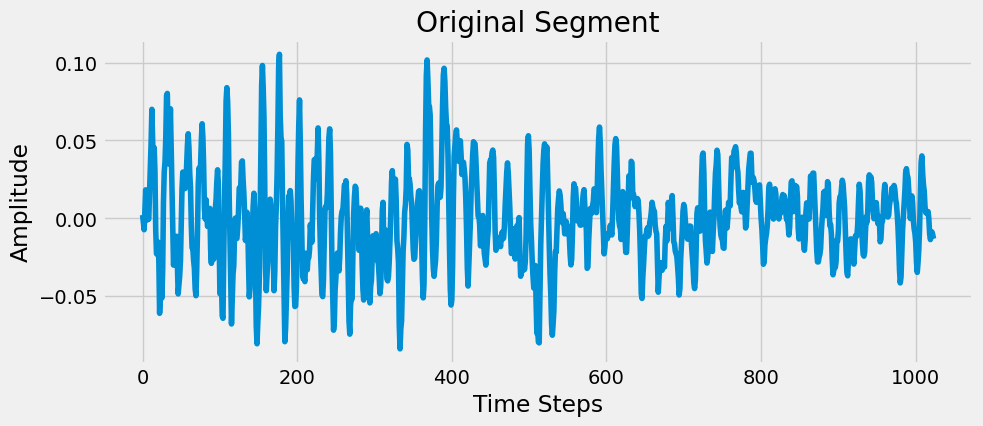

Example of an augmented waveform segment:


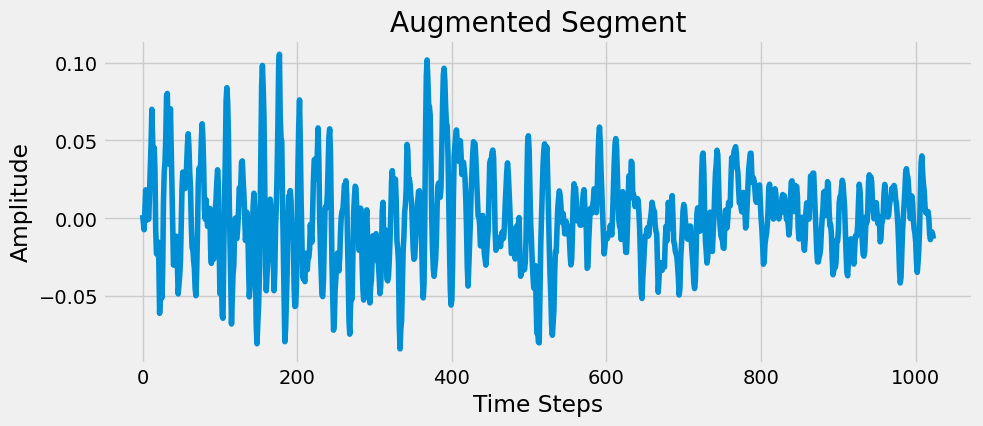

In [9]:
print('Example of a raw waveform segment:')

mono_audio, _ = librosa.load('ESC-50-master/audio/3-144106-A-32.wav', sr=None, mono=True)
original_segment_to_plot = mono_audio[0:1024]

# Plot the original segment
plt.figure(figsize=(10, 4))
plt.plot(original_segment_to_plot)
plt.title('Original Segment')
plt.xlabel('Time Steps')
plt.ylabel('Amplitude')
plt.show()


print('Example of an augmented waveform segment:')
# Plot the augmented segment
augmented_data_plot = augment_and_reshape(mono_audio)
plt.figure(figsize=(10, 4))
plt.plot(augmented_data_plot[0])
plt.title('Augmented Segment')
plt.xlabel('Time Steps')
plt.ylabel('Amplitude')
plt.show()


#### data generator

In [10]:
X = []
y = []

global X
global y

In [79]:
from tensorflow.keras.utils import to_categorical

class AudioDataGenerator(tf.keras.utils.Sequence):
    def __init__(self, audio_directory, labels, batch_size=32, window_size=1024, hop_size=512):
        self.audio_directory = audio_directory
        self.labels = labels
        self.batch_size = batch_size
        self.window_size = window_size
        self.hop_size = hop_size
        self.audio_files = [file for file in os.listdir(audio_directory) if file.endswith(".wav")]
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.audio_files) / self.batch_size))

    def __getitem__(self, index):
        start_idx = index * self.batch_size
        end_idx = (index + 1) * self.batch_size
        batch_files = self.audio_files[start_idx:end_idx]

        X, y = self.__data_generation(batch_files)

        return X, y

    def on_epoch_end(self):
        np.random.shuffle(self.audio_files)

    def __data_generation(self, batch_files):
        X = []
        y = []
        for file in batch_files:
           input_path = os.path.join(self.audio_directory, file)

           # Load monaural WAV file
           mono_audio, _ = librosa.load(input_path, sr=None, mono=True)

           # Data augmentation
           augmented_data = augment_and_reshape(mono_audio, target_length=20480, window_size=self.window_size, hop_size=self.hop_size)
            # TODO: segmentation. For now, just use the whole file
            
           X.append(augmented_data)
           y.append(self.labels[file])
        
        # Flatten the data into a single channel
        #X = X.reshape(X.shape[0] * X.shape[1], X.shape[2], X.shape[3])
        return np.array(X), to_categorical(np.array(y), num_classes=num_classes)


In [83]:
# Example usage:
df = pd.read_csv('ESC-50-master/meta/esc50.csv')
audio_directory = 'ESC-50-master/audio/'
labels = df.set_index('filename')['target'].to_dict()
num_classes = len(set(labels.values()))
input_shape = (77, 1024, 1)



train_generator = AudioDataGenerator(audio_directory, labels, batch_size=32, window_size=1024, hop_size=512)


rawnet_model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Now you can use train_generator to fit your model
rawnet_model.fit(train_generator, epochs=20)

(16, 77, 1024, 1)
Epoch 1/20
(16, 77, 1024, 1)
(16, 77, 1024, 1)
(16, 77, 1024, 1)
 31/125 [======>.......................] - ETA: 2:51 - loss: 4.0970 - accuracy: 0.0323(16, 77, 1024, 1)


KeyboardInterrupt: 

### Log mel spectrogram for MelNet

Use of Librosa Library:

1. The feature extraction method is based on Piczak [4].
   * The librosa Python library is employed for this purpose.
2. Log-scaled Mel-spectrogram Features:
   * Log-scaled mel-spectrogram features are extracted.
   * 60 bands are used to cover the frequency range from 0 to 22,050 Hz of the sound segments.
3. Segmentation of Sound:
   * The sound segments are divided into 41 frames.
   * Frames have a 50% overlap, implying that adjacent frames share half of their content.
   * Each frame is approximately 23 ms in duration.
4. Representation as a Matrix:
   * The static log-scaled mel-spectrogram feature for each segment is represented as a matrix.
   * Matrix dimensions: 60 × 40 × 1, corresponding to frequency × time × channel.
5. Calculation of Temporal Derivative:
   * The first temporal derivative of the log-mel feature is calculated on each frame.
   * This delta log-scaled mel-spectrogram feature serves as the second channel of input.
6. Final Representation:
   * The extracted log-scaled mel-spectrogram feature maps have dimensions 60 × 41 × 2.
   * The third dimension (2) corresponds to the two channels: the original log-scaled mel-spectrogram and its temporal derivative.

Feature Maps Shape: (60, 429, 2)


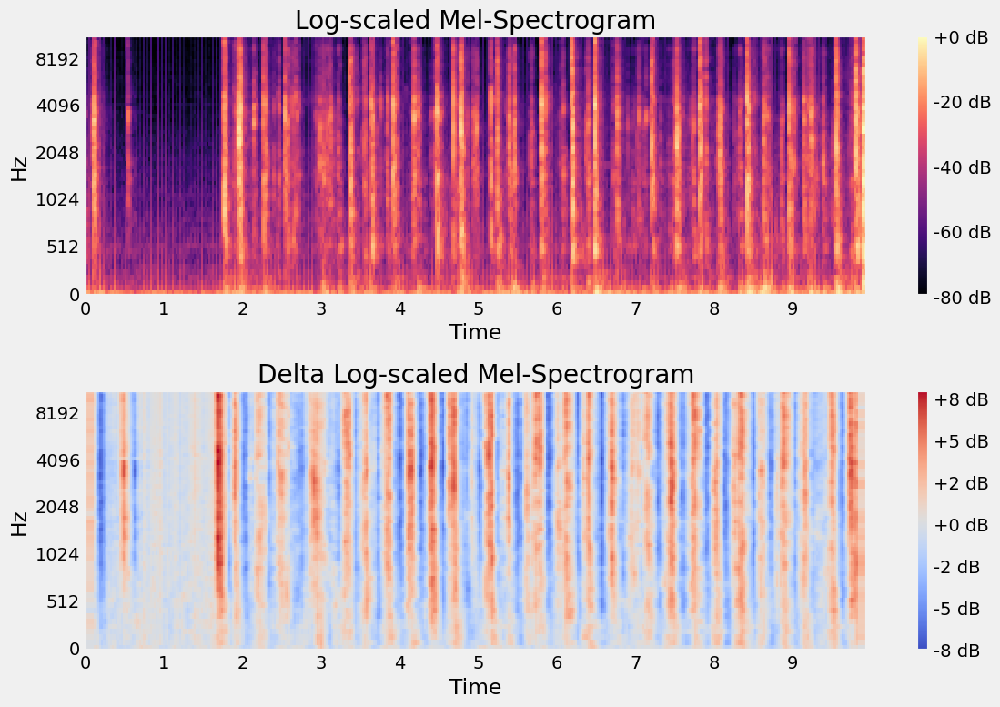

In [25]:
import librosa
import numpy as np
import matplotlib.pyplot as plt

# Load an example audio file
audio_path = 'augmented_data/1-137-A-32.wav'
audio, sr = librosa.load(audio_path, sr=None, mono=True)

# Compute log-scaled mel-spectrogram with 60 bands
mel_spectrogram = librosa.feature.melspectrogram(y=audio, sr=sr, n_mels=60, hop_length=512, n_fft=1024)
log_mel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)

# Calculate the first temporal derivative (delta)
delta_log_mel_spectrogram = librosa.feature.delta(log_mel_spectrogram)

# Stack the static and delta features along the last axis
feature_maps = np.stack([log_mel_spectrogram, delta_log_mel_spectrogram], axis=-1)

# Display the dimensions of the feature maps
print("Feature Maps Shape:", feature_maps.shape)

# Plot the log-scaled mel-spectrogram and its delta
plt.figure(figsize=(12, 8))

plt.subplot(2, 1, 1)
librosa.display.specshow(log_mel_spectrogram, sr=sr, hop_length=512, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Log-scaled Mel-Spectrogram')

plt.subplot(2, 1, 2)
librosa.display.specshow(delta_log_mel_spectrogram, sr=sr, hop_length=512, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Delta Log-scaled Mel-Spectrogram')

plt.tight_layout()
plt.show()


In [82]:
import tensorflow as tf
from tensorflow.keras import layers, models

def conv_block(x, filters, kernel_size, stride, activation='relu', use_batch_norm=True, dropout_rate=None):
    # Convolutional layer
    x = layers.Conv2D(filters, kernel_size, strides=stride, padding='same')(x)
    
    # Batch Normalization
    if use_batch_norm:
        x = layers.BatchNormalization()(x)
    
    # Activation function
    x = layers.Activation(activation)(x)
    
    # Dropout
    if dropout_rate:
        x = layers.Dropout(dropout_rate)(x)
    
    return x

def fully_connected_block(x, units, activation='relu', use_batch_norm=True, dropout_rate=None):
    # Fully Connected layer
    x = layers.Dense(units)(x)
    
    # Batch Normalization
    if use_batch_norm:
        x = layers.BatchNormalization()(x)
    
    # Activation function
    x = layers.Activation(activation)(x)
    
    # Dropout
    if dropout_rate:
        x = layers.Dropout(dropout_rate)(x)
    
    return x

def build_rawnet(input_shape=(77, 1024, 1), num_classes=50):
    inputs = tf.keras.Input(shape=input_shape, name='input_layer')

    # Recognition Module (RawNet)
    x = conv_block(inputs, 24, (6, 6), (1, 1))
    x = conv_block(x, 24, (6, 6), (1, 1))
    x = conv_block(x, 48, (5, 5), (2, 2))
    x = conv_block(x, 48, (5, 5), (2, 2))
    x = conv_block(x, 64, (4, 4), (2, 2))

    # Global Average Pooling to reduce spatial dimensions
    x = layers.GlobalAveragePooling2D()(x)


    # Fully Connected layers
    x = fully_connected_block(x, 200)

    # Output layer
    outputs = layers.Dense(num_classes, activation='softmax', name='output_layer')(x)

    model = models.Model(inputs=inputs, outputs=outputs, name='RawNet')

    return model

def build_melnet(input_shape, num_classes):
    inputs = tf.keras.Input(shape=input_shape, name='input_layer')
    
    # Recognition Module (MelNet)
    x = conv_block(inputs, 24, (6, 6), (1, 1))
    x = conv_block(x, 24, (6, 6), (1, 1))
    x = conv_block(x, 48, (5, 5), (2, 2))
    x = conv_block(x, 48, (5, 5), (2, 2))
    x = conv_block(x, 64, (4, 4), (2, 2))
    
    # Flatten before fully connected layers
    x = layers.Flatten()(x)
    
    # Fully Connected layers
    x = fully_connected_block(x, 200)
    
    # Output layer
    outputs = layers.Dense(num_classes, activation='softmax', name='output_layer')(x)
    
    model = models.Model(inputs=inputs, outputs=outputs, name='MelNet')
    
    return model

input_shape = (77, 1024, 1)
rawnet_model = build_rawnet(input_shape, num_classes)
melnet_model = build_melnet(input_shape, num_classes)

# Display model summaries
rawnet_model.summary()
melnet_model.summary()


Model: "RawNet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 77, 1024, 1)]     0         
                                                                 
 conv2d_91 (Conv2D)          (None, 77, 1024, 24)      888       
                                                                 
 batch_normalization_95 (Ba  (None, 77, 1024, 24)      96        
 tchNormalization)                                               
                                                                 
 activation_95 (Activation)  (None, 77, 1024, 24)      0         
                                                                 
 conv2d_92 (Conv2D)          (None, 77, 1024, 24)      20760     
                                                                 
 batch_normalization_96 (Ba  (None, 77, 1024, 24)      96        
 tchNormalization)                                          

In [ ]:
# remember data to use for augmented


In [125]:
# let's try to build the rawnet model
from tensorflow.keras import layers, models

   
rawnet_model = models.Sequential([
    tf.keras.layers.Conv2D(40, (1, 8), strides=(1 , 1), input_shape=input_shape),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.Conv2D(40, (1, 8), strides=(1 , 1)),
    tf.keras.layers.Activation('relu'),
    tf.keras.layers.MaxPooling2D(pool_size=(1, 128), strides=(1, 128))
])

# Define the input shape
input_shape = (X_train.shape[1], X_train.shape[2], 1)
# Compile
rawnet_model.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
# Display the model summary
rawnet_model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 40, 209, 40)       360       
                                                                 
 activation_4 (Activation)   (None, 40, 209, 40)       0         
                                                                 
 conv2d_9 (Conv2D)           (None, 40, 202, 40)       12840     
                                                                 
 activation_5 (Activation)   (None, 40, 202, 40)       0         
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 40, 1, 40)         0         
 g2D)                                                            
                                                                 
Total params: 13200 (51.56 KB)
Trainable params: 13200 (51.56 KB)
Non-trainable params: 0 (0.00 Byte)
__________________

In [118]:
# Load an example mono audio file
file_path = 'ESC-50-master/audio/1-100032-A-0.wav'
audio, _ = librosa.load(file_path, sr=None, mono=True)

# Reshape the audio to match the expected input shape
input_audio = np.expand_dims(np.expand_dims(audio, axis=0), axis=-1)

# Check the shape
print(input_audio.shape)  

(1, 220500, 1)
[[[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]]


In [126]:
batch_size = 3
callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss', min_delta=0, patience=8, verbose=1, mode='auto',
    baseline=None, restore_best_weights=False)

history = rawnet_model.fit(X_train_cnn,y_train_cnn,
            validation_data=(X_test_cnn,y_test_cnn),
            epochs=40,
            callbacks = [callback],batch_size=batch_size)

Epoch 1/40


ValueError: in user code:

    File "c:\Users\matti\miniconda3\Lib\site-packages\keras\src\engine\training.py", line 1377, in train_function  *
        return step_function(self, iterator)
    File "c:\Users\matti\miniconda3\Lib\site-packages\keras\src\engine\training.py", line 1360, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "c:\Users\matti\miniconda3\Lib\site-packages\keras\src\engine\training.py", line 1349, in run_step  **
        outputs = model.train_step(data)
    File "c:\Users\matti\miniconda3\Lib\site-packages\keras\src\engine\training.py", line 1127, in train_step
        loss = self.compute_loss(x, y, y_pred, sample_weight)
    File "c:\Users\matti\miniconda3\Lib\site-packages\keras\src\engine\training.py", line 1185, in compute_loss
        return self.compiled_loss(
    File "c:\Users\matti\miniconda3\Lib\site-packages\keras\src\engine\compile_utils.py", line 277, in __call__
        loss_value = loss_obj(y_t, y_p, sample_weight=sw)
    File "c:\Users\matti\miniconda3\Lib\site-packages\keras\src\losses.py", line 143, in __call__
        losses = call_fn(y_true, y_pred)
    File "c:\Users\matti\miniconda3\Lib\site-packages\keras\src\losses.py", line 270, in call  **
        return ag_fn(y_true, y_pred, **self._fn_kwargs)
    File "c:\Users\matti\miniconda3\Lib\site-packages\keras\src\losses.py", line 2221, in categorical_crossentropy
        return backend.categorical_crossentropy(
    File "c:\Users\matti\miniconda3\Lib\site-packages\keras\src\backend.py", line 5575, in categorical_crossentropy
        target.shape.assert_is_compatible_with(output.shape)

    ValueError: Shapes (None, 50) and (None, 40, 1, 40) are incompatible
